In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter

In [11]:
from torch.nn.modules.activation import LeakyReLU
class Discriminator(nn.Module):
  def __init__(self, img_dim):
    super().__init__()
    self.disc = nn.Sequential(
        nn.Linear(img_dim, 128),
        nn.LeakyReLU(0.1),
        nn.Linear(128, 1),
        nn.Sigmoid()
    )

  def forward(self, x):
    return self.disc(x)


In [12]:
class Generator(nn.Module):
  def __init__(self, z_dim, img_dim):
    super().__init__()
    self.gen = nn.Sequential(
        nn.Linear(z_dim, 256),
        nn.LeakyReLU(0.1),
        nn.Linear(256, img_dim),
        nn.Tanh(),
    )

  def forward(self, x):
    return self.gen(x)

In [13]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
lr = 3e-4
z_dim = 64
image_dim = 28*28*1
batch_size = 32
num_epochs = 50

disc = Discriminator(image_dim).to(device)
gen = Generator(z_dim, image_dim).to(device)
fixed_noise = torch.randn((batch_size, z_dim)).to(device)
transforms = transforms.Compose(
    [transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))]
)
dataset = datasets.MNIST(root = 'dataset/', transform=transforms, download=True)
loader = DataLoader(dataset, batch_size = batch_size, shuffle=True)
opt_disc = optim.Adam(disc.parameters(), lr = lr)
opt_gen = optim.Adam(gen.parameters(), lr =lr)
criterion= nn.BCELoss()
writer_fake = SummaryWriter(f'/content/gan_gen/')
writer_real = SummaryWriter(f'/content/gan_disc')
step = 0


Epoch [0/50] batch [0/1875] lossD:  0.7642, lossG:  0.699614


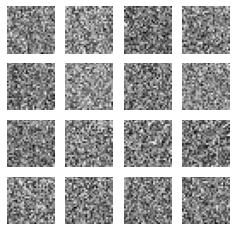

Epoch [0/50] batch [400/1875] lossD:  0.6182, lossG:  0.692270


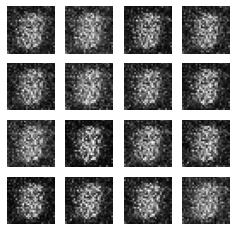

Epoch [0/50] batch [800/1875] lossD:  0.4950, lossG:  1.024467


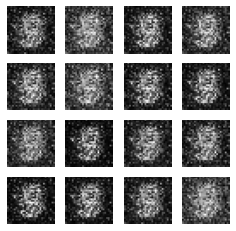

Epoch [0/50] batch [1200/1875] lossD:  0.2097, lossG:  2.145708


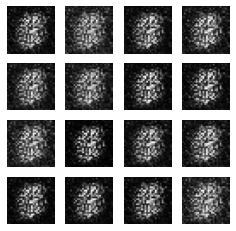

Epoch [0/50] batch [1600/1875] lossD:  0.3554, lossG:  1.319874


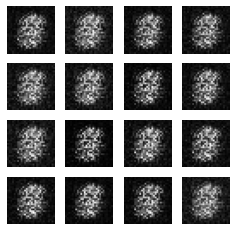

Epoch [1/50] batch [0/1875] lossD:  0.3258, lossG:  1.515081


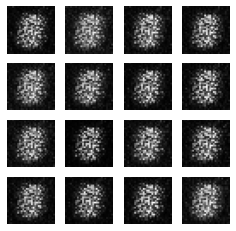

Epoch [1/50] batch [400/1875] lossD:  0.5776, lossG:  0.917802


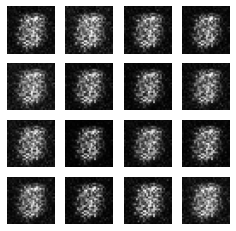

Epoch [1/50] batch [800/1875] lossD:  0.3510, lossG:  1.377752


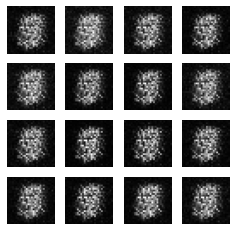

Epoch [1/50] batch [1200/1875] lossD:  0.5076, lossG:  1.129786


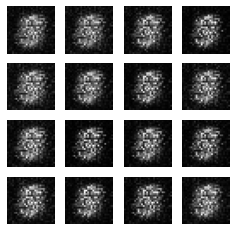

Epoch [1/50] batch [1600/1875] lossD:  0.6424, lossG:  0.933366


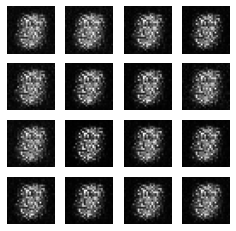

Epoch [2/50] batch [0/1875] lossD:  0.5348, lossG:  1.034977


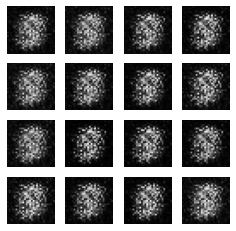

Epoch [2/50] batch [400/1875] lossD:  0.3324, lossG:  2.139186


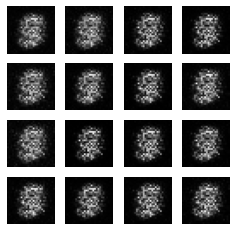

Epoch [2/50] batch [800/1875] lossD:  0.6162, lossG:  0.812186


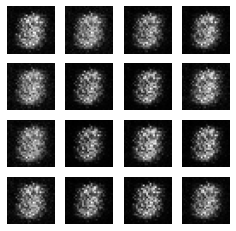

Epoch [2/50] batch [1200/1875] lossD:  0.6131, lossG:  0.978590


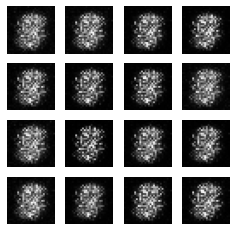

Epoch [2/50] batch [1600/1875] lossD:  0.6486, lossG:  0.832023


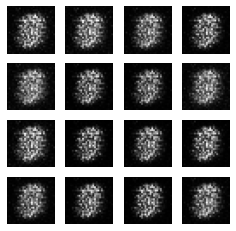

Epoch [3/50] batch [0/1875] lossD:  0.6308, lossG:  0.880165


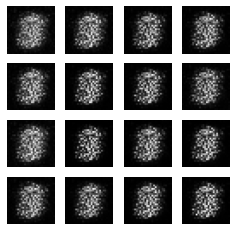

Epoch [3/50] batch [400/1875] lossD:  0.4584, lossG:  1.276949


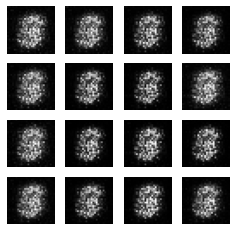

Epoch [3/50] batch [800/1875] lossD:  0.6215, lossG:  0.780643


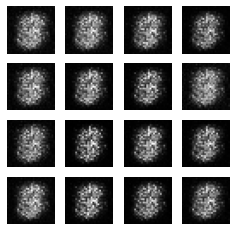

Epoch [3/50] batch [1200/1875] lossD:  0.5281, lossG:  0.992534


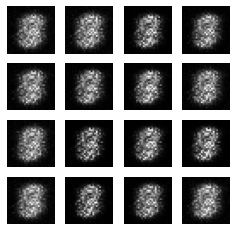

Epoch [3/50] batch [1600/1875] lossD:  0.5992, lossG:  0.904503


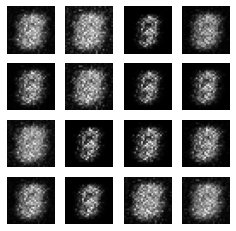

Epoch [4/50] batch [0/1875] lossD:  0.5814, lossG:  0.866143


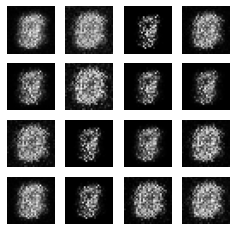

Epoch [4/50] batch [400/1875] lossD:  0.5747, lossG:  1.290246


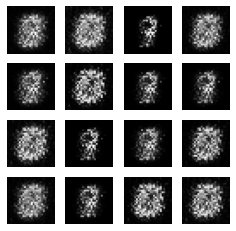

Epoch [4/50] batch [800/1875] lossD:  0.3528, lossG:  1.377092


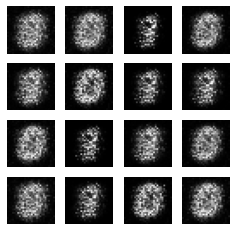

Epoch [4/50] batch [1200/1875] lossD:  0.7501, lossG:  0.809366


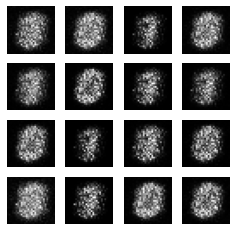

Epoch [4/50] batch [1600/1875] lossD:  0.4991, lossG:  1.287266


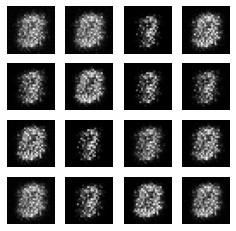

Epoch [5/50] batch [0/1875] lossD:  0.6948, lossG:  0.961613


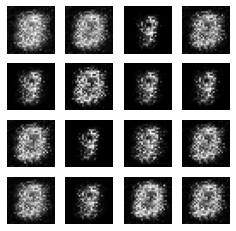

Epoch [5/50] batch [400/1875] lossD:  0.8555, lossG:  0.737441


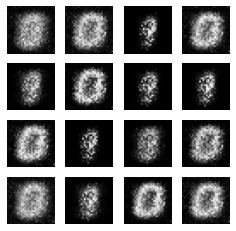

Epoch [5/50] batch [800/1875] lossD:  0.6169, lossG:  1.024347


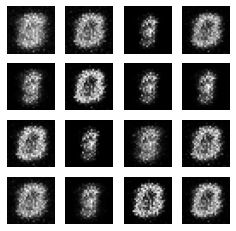

Epoch [5/50] batch [1200/1875] lossD:  0.7698, lossG:  0.806292


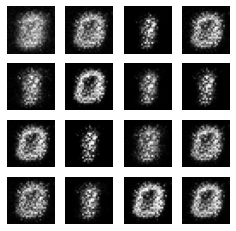

Epoch [5/50] batch [1600/1875] lossD:  0.6312, lossG:  1.097594


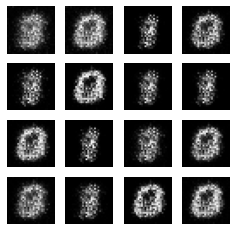

Epoch [6/50] batch [0/1875] lossD:  0.5033, lossG:  1.123124


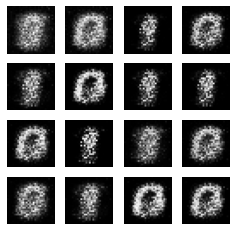

Epoch [6/50] batch [400/1875] lossD:  0.6290, lossG:  1.045088


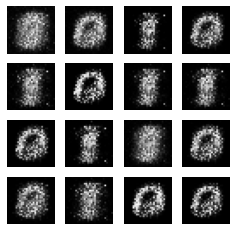

Epoch [6/50] batch [800/1875] lossD:  0.6819, lossG:  0.745892


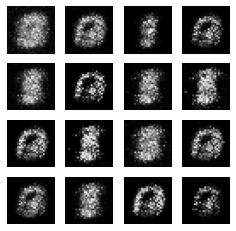

Epoch [6/50] batch [1200/1875] lossD:  0.8785, lossG:  0.859307


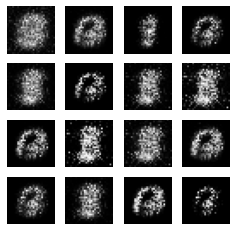

Epoch [6/50] batch [1600/1875] lossD:  0.7205, lossG:  0.746480


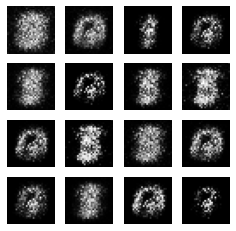

Epoch [7/50] batch [0/1875] lossD:  0.7137, lossG:  0.816708


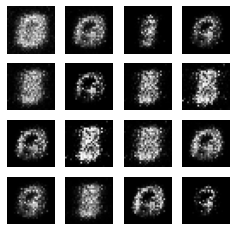

Epoch [7/50] batch [400/1875] lossD:  0.4133, lossG:  1.305196


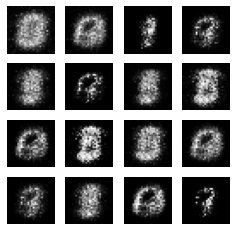

Epoch [7/50] batch [800/1875] lossD:  0.6048, lossG:  0.775685


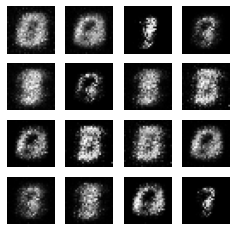

Epoch [7/50] batch [1200/1875] lossD:  0.7348, lossG:  0.917931


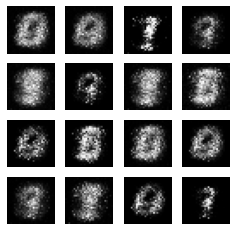

Epoch [7/50] batch [1600/1875] lossD:  0.5936, lossG:  1.196910


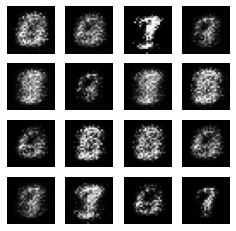

Epoch [8/50] batch [0/1875] lossD:  0.8159, lossG:  0.837171


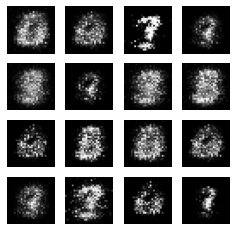

Epoch [8/50] batch [400/1875] lossD:  0.5068, lossG:  1.116123


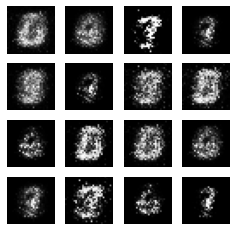

Epoch [8/50] batch [800/1875] lossD:  0.4961, lossG:  1.014325


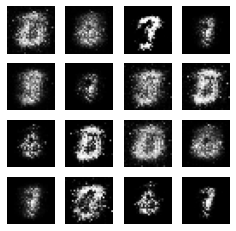

Epoch [8/50] batch [1200/1875] lossD:  0.7895, lossG:  0.855832


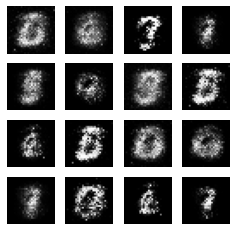

Epoch [8/50] batch [1600/1875] lossD:  0.6441, lossG:  0.894548


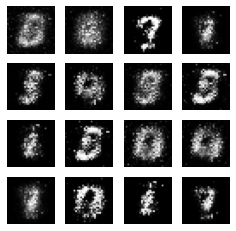

Epoch [9/50] batch [0/1875] lossD:  0.4957, lossG:  1.026700


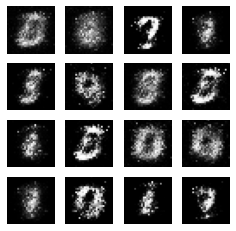

Epoch [9/50] batch [400/1875] lossD:  0.4141, lossG:  1.710442


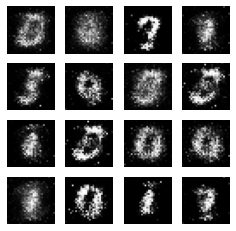

Epoch [9/50] batch [800/1875] lossD:  0.4561, lossG:  1.362391


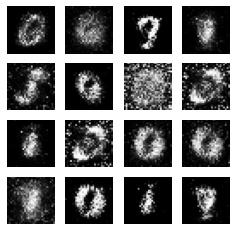

Epoch [9/50] batch [1200/1875] lossD:  0.5987, lossG:  1.260575


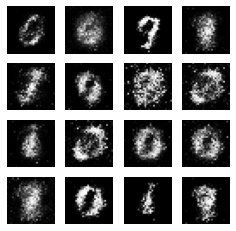

Epoch [9/50] batch [1600/1875] lossD:  0.4802, lossG:  1.201776


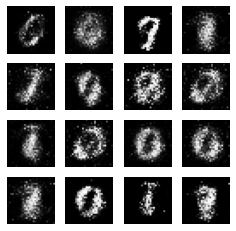

Epoch [10/50] batch [0/1875] lossD:  0.4609, lossG:  1.759595


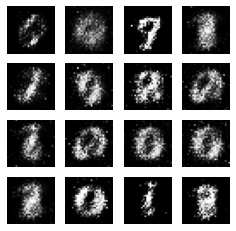

Epoch [10/50] batch [400/1875] lossD:  0.5795, lossG:  1.375242


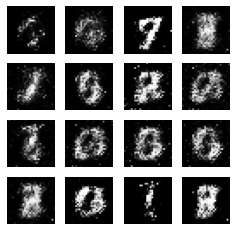

Epoch [10/50] batch [800/1875] lossD:  0.7007, lossG:  1.124760


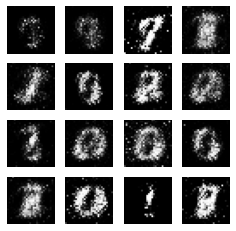

Epoch [10/50] batch [1200/1875] lossD:  0.3484, lossG:  1.752962


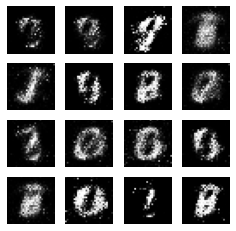

Epoch [10/50] batch [1600/1875] lossD:  0.7977, lossG:  1.015582


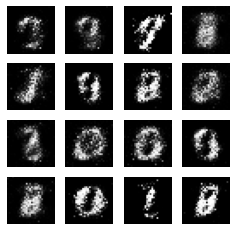

Epoch [11/50] batch [0/1875] lossD:  0.7624, lossG:  1.177224


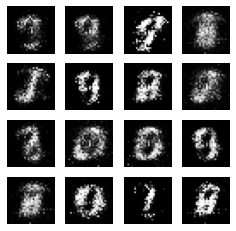

Epoch [11/50] batch [400/1875] lossD:  0.4904, lossG:  1.111212


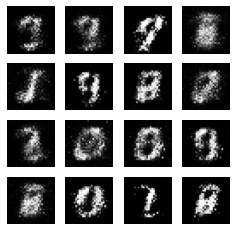

Epoch [11/50] batch [800/1875] lossD:  0.6112, lossG:  1.127532


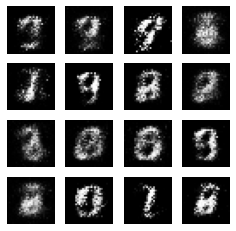

Epoch [11/50] batch [1200/1875] lossD:  0.6090, lossG:  1.108867


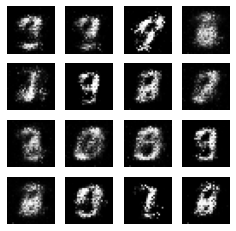

Epoch [11/50] batch [1600/1875] lossD:  0.5096, lossG:  1.048407


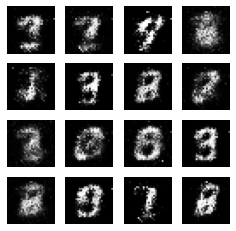

Epoch [12/50] batch [0/1875] lossD:  0.5785, lossG:  1.011176


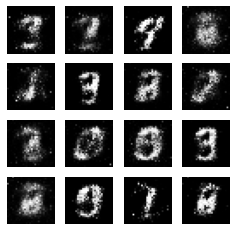

Epoch [12/50] batch [400/1875] lossD:  0.7843, lossG:  0.937296


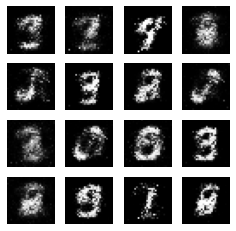

Epoch [12/50] batch [800/1875] lossD:  0.5112, lossG:  1.246994


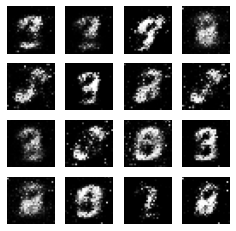

Epoch [12/50] batch [1200/1875] lossD:  0.6269, lossG:  1.082237


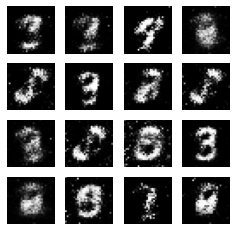

Epoch [12/50] batch [1600/1875] lossD:  0.9902, lossG:  0.720789


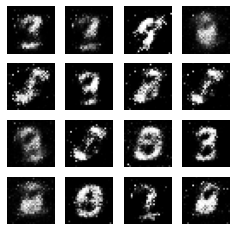

Epoch [13/50] batch [0/1875] lossD:  0.7764, lossG:  1.044441


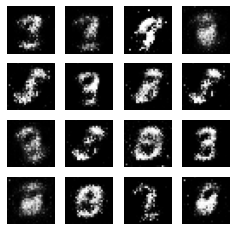

Epoch [13/50] batch [400/1875] lossD:  0.7489, lossG:  1.059740


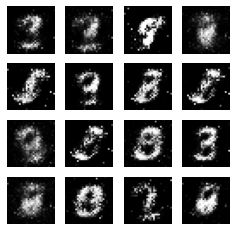

Epoch [13/50] batch [800/1875] lossD:  0.5551, lossG:  1.200529


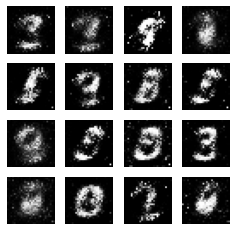

Epoch [13/50] batch [1200/1875] lossD:  0.5738, lossG:  1.136884


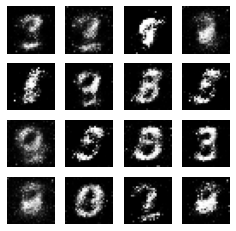

Epoch [13/50] batch [1600/1875] lossD:  0.7934, lossG:  0.816785


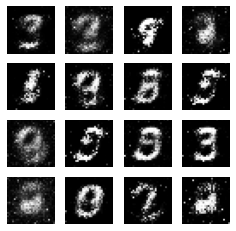

Epoch [14/50] batch [0/1875] lossD:  0.4938, lossG:  1.129854


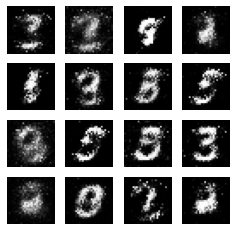

Epoch [14/50] batch [400/1875] lossD:  0.6012, lossG:  1.324575


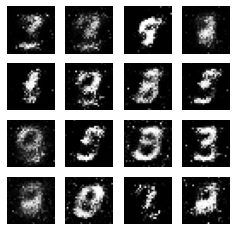

Epoch [14/50] batch [800/1875] lossD:  0.4824, lossG:  1.468429


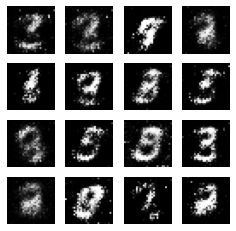

Epoch [14/50] batch [1200/1875] lossD:  0.7403, lossG:  1.000968


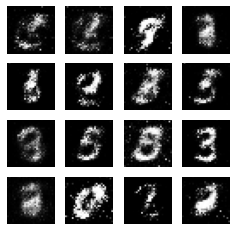

Epoch [14/50] batch [1600/1875] lossD:  0.6617, lossG:  1.269593


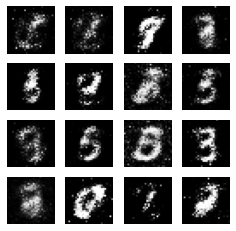

Epoch [15/50] batch [0/1875] lossD:  0.9074, lossG:  0.909598


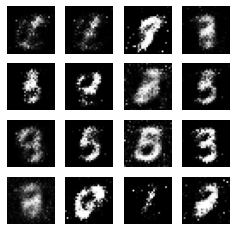

Epoch [15/50] batch [400/1875] lossD:  0.7466, lossG:  1.133041


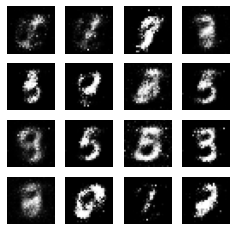

Epoch [15/50] batch [800/1875] lossD:  0.7690, lossG:  0.940926


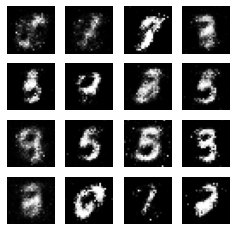

Epoch [15/50] batch [1200/1875] lossD:  0.7070, lossG:  1.099437


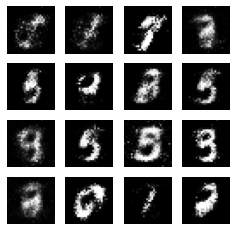

Epoch [15/50] batch [1600/1875] lossD:  1.0275, lossG:  0.491349


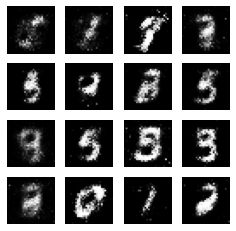

Epoch [16/50] batch [0/1875] lossD:  0.6173, lossG:  1.154365


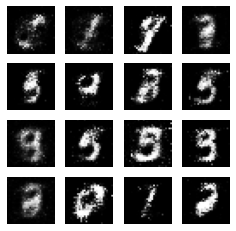

Epoch [16/50] batch [400/1875] lossD:  0.9881, lossG:  0.840318


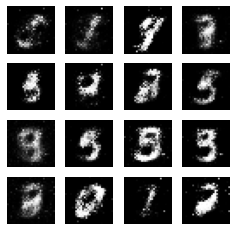

Epoch [16/50] batch [800/1875] lossD:  0.5369, lossG:  1.167499


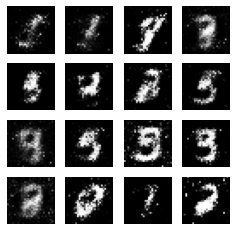

Epoch [16/50] batch [1200/1875] lossD:  0.5248, lossG:  0.974030


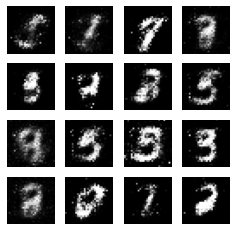

Epoch [16/50] batch [1600/1875] lossD:  0.7918, lossG:  0.926773


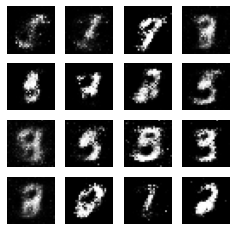

Epoch [17/50] batch [0/1875] lossD:  0.5289, lossG:  1.246662


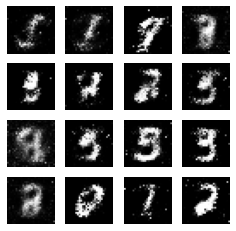

Epoch [17/50] batch [400/1875] lossD:  0.7939, lossG:  0.862410


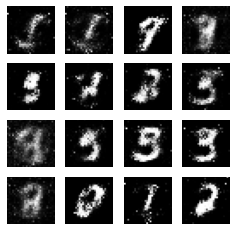

Epoch [17/50] batch [800/1875] lossD:  0.7659, lossG:  1.164117


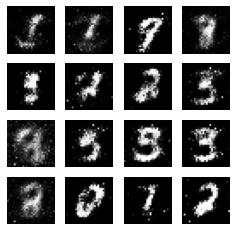

Epoch [17/50] batch [1200/1875] lossD:  0.6364, lossG:  1.292483


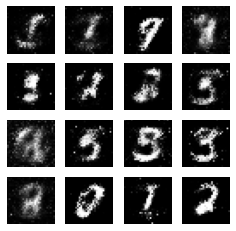

Epoch [17/50] batch [1600/1875] lossD:  0.5888, lossG:  0.854010


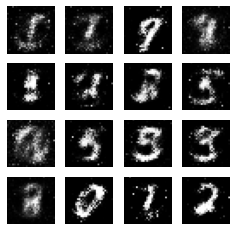

Epoch [18/50] batch [0/1875] lossD:  0.6202, lossG:  1.242650


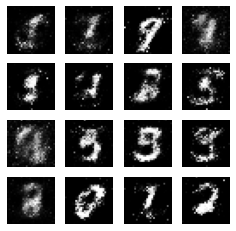

Epoch [18/50] batch [400/1875] lossD:  0.6171, lossG:  0.994521


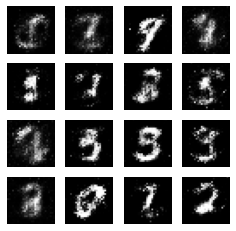

Epoch [18/50] batch [800/1875] lossD:  0.8594, lossG:  0.807606


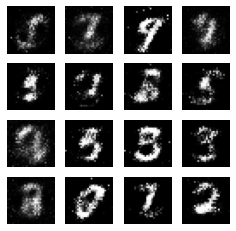

Epoch [18/50] batch [1200/1875] lossD:  0.5597, lossG:  1.078127


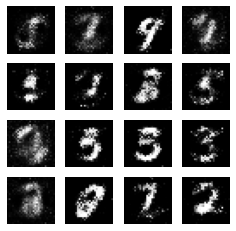

Epoch [18/50] batch [1600/1875] lossD:  0.5472, lossG:  0.985122


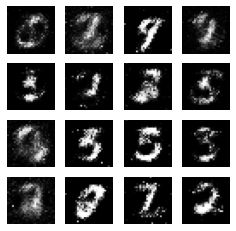

Epoch [19/50] batch [0/1875] lossD:  0.4546, lossG:  1.057484


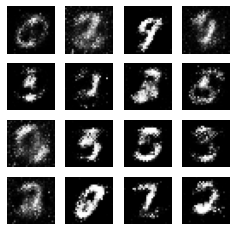

Epoch [19/50] batch [400/1875] lossD:  0.5879, lossG:  1.124218


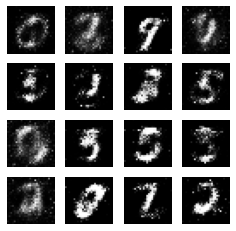

Epoch [19/50] batch [800/1875] lossD:  0.6088, lossG:  1.125263


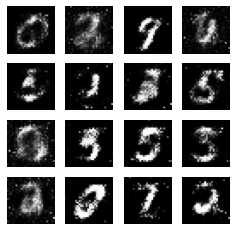

Epoch [19/50] batch [1200/1875] lossD:  0.5411, lossG:  1.220773


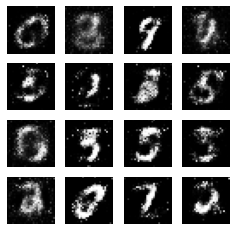

Epoch [19/50] batch [1600/1875] lossD:  0.5675, lossG:  1.220395


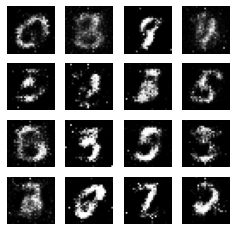

Epoch [20/50] batch [0/1875] lossD:  0.7651, lossG:  1.154840


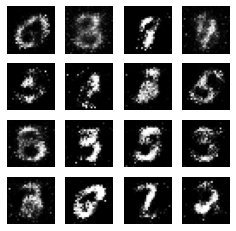

Epoch [20/50] batch [400/1875] lossD:  0.7354, lossG:  1.131253


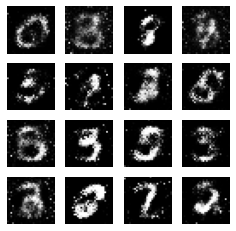

Epoch [20/50] batch [800/1875] lossD:  0.6739, lossG:  1.140308


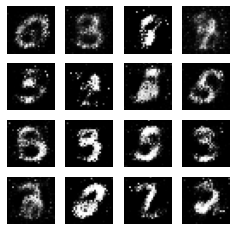

Epoch [20/50] batch [1200/1875] lossD:  0.5164, lossG:  1.317229


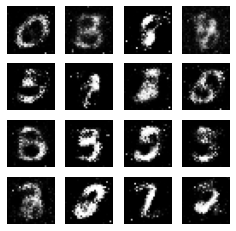

Epoch [20/50] batch [1600/1875] lossD:  0.6460, lossG:  1.080539


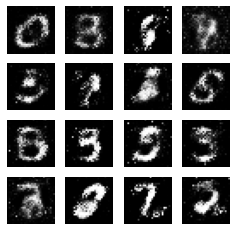

Epoch [21/50] batch [0/1875] lossD:  0.7406, lossG:  0.753702


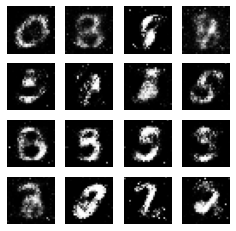

Epoch [21/50] batch [400/1875] lossD:  0.4655, lossG:  1.345980


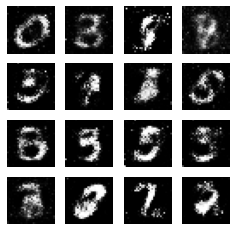

Epoch [21/50] batch [800/1875] lossD:  0.5476, lossG:  1.477103


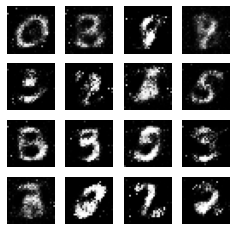

Epoch [21/50] batch [1200/1875] lossD:  0.6732, lossG:  1.175622


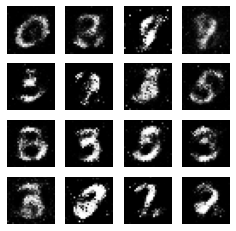

Epoch [21/50] batch [1600/1875] lossD:  0.5973, lossG:  0.991532


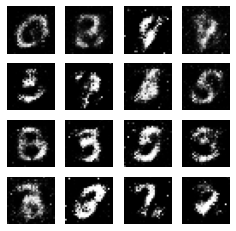

Epoch [22/50] batch [0/1875] lossD:  0.5934, lossG:  1.213064


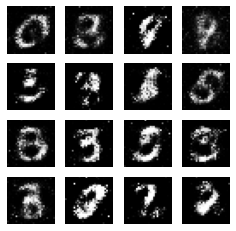

Epoch [22/50] batch [400/1875] lossD:  0.6648, lossG:  0.974734


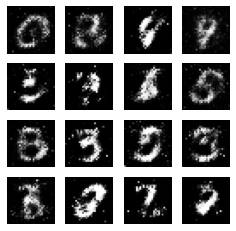

Epoch [22/50] batch [800/1875] lossD:  0.7201, lossG:  0.821009


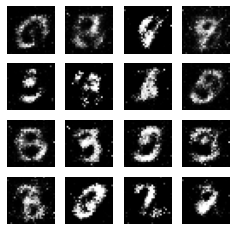

Epoch [22/50] batch [1200/1875] lossD:  0.6650, lossG:  1.073170


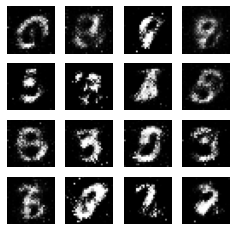

Epoch [22/50] batch [1600/1875] lossD:  0.6941, lossG:  1.135722


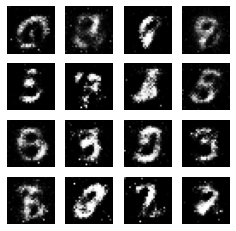

Epoch [23/50] batch [0/1875] lossD:  0.6347, lossG:  1.402931


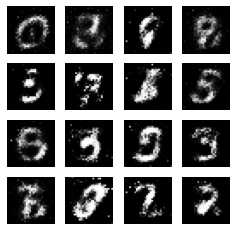

Epoch [23/50] batch [400/1875] lossD:  0.7193, lossG:  1.220268


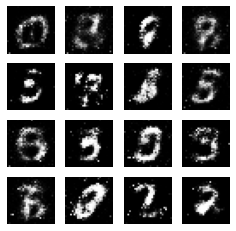

Epoch [23/50] batch [800/1875] lossD:  0.5450, lossG:  1.227584


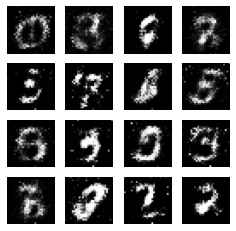

Epoch [23/50] batch [1200/1875] lossD:  0.6550, lossG:  1.052432


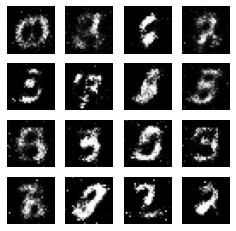

Epoch [23/50] batch [1600/1875] lossD:  0.6433, lossG:  1.242854


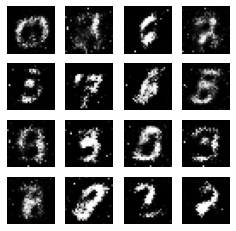

Epoch [24/50] batch [0/1875] lossD:  0.5242, lossG:  1.431460


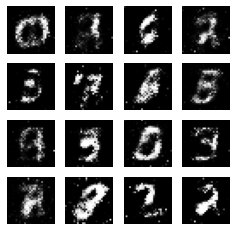

Epoch [24/50] batch [400/1875] lossD:  0.5905, lossG:  1.042130


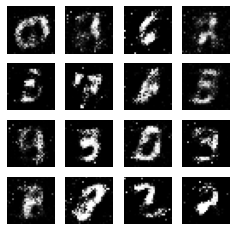

Epoch [24/50] batch [800/1875] lossD:  0.5719, lossG:  1.295836


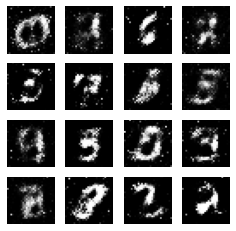

Epoch [24/50] batch [1200/1875] lossD:  0.6716, lossG:  1.084440


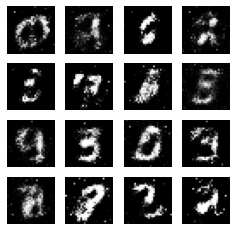

Epoch [24/50] batch [1600/1875] lossD:  0.6322, lossG:  1.351300


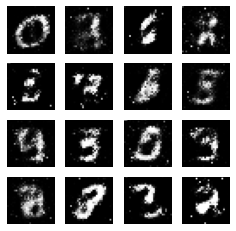

Epoch [25/50] batch [0/1875] lossD:  0.5782, lossG:  1.237199


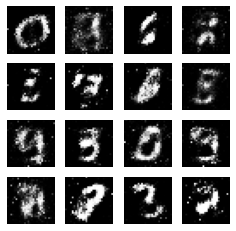

Epoch [25/50] batch [400/1875] lossD:  0.5529, lossG:  1.318520


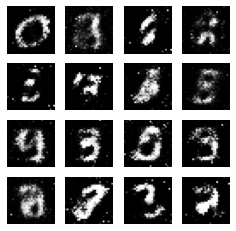

Epoch [25/50] batch [800/1875] lossD:  0.6340, lossG:  0.662840


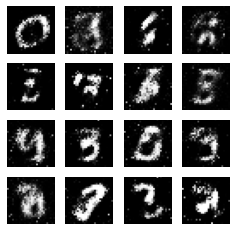

Epoch [25/50] batch [1200/1875] lossD:  0.5199, lossG:  1.460262


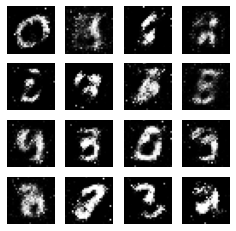

Epoch [25/50] batch [1600/1875] lossD:  0.5653, lossG:  1.186583


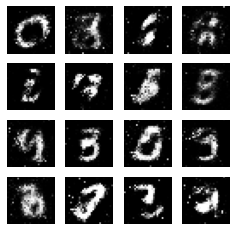

Epoch [26/50] batch [0/1875] lossD:  0.5109, lossG:  1.298277


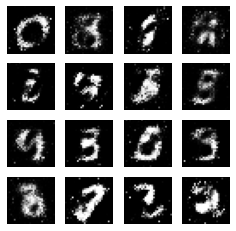

Epoch [26/50] batch [400/1875] lossD:  0.4754, lossG:  1.177530


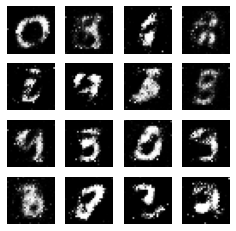

Epoch [26/50] batch [800/1875] lossD:  0.7465, lossG:  1.218787


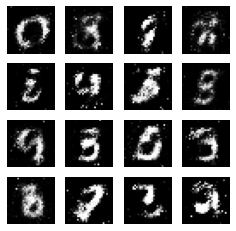

Epoch [26/50] batch [1200/1875] lossD:  0.5577, lossG:  1.329859


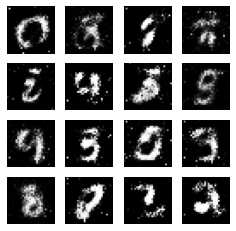

Epoch [26/50] batch [1600/1875] lossD:  0.6628, lossG:  1.413670


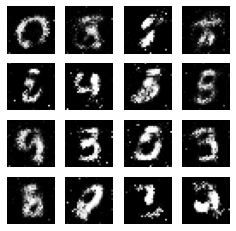

Epoch [27/50] batch [0/1875] lossD:  0.6900, lossG:  1.217820


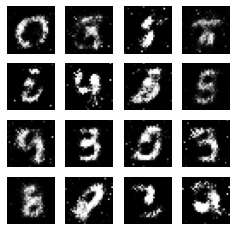

Epoch [27/50] batch [400/1875] lossD:  0.5625, lossG:  1.139542


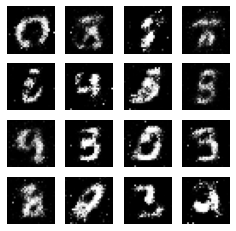

Epoch [27/50] batch [800/1875] lossD:  0.6540, lossG:  1.260915


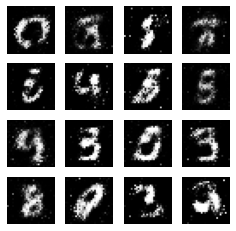

Epoch [27/50] batch [1200/1875] lossD:  0.5090, lossG:  1.317322


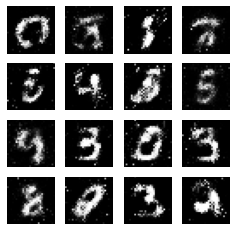

Epoch [27/50] batch [1600/1875] lossD:  0.5517, lossG:  0.977475


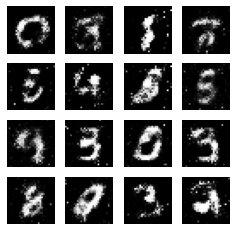

Epoch [28/50] batch [0/1875] lossD:  0.6144, lossG:  1.425724


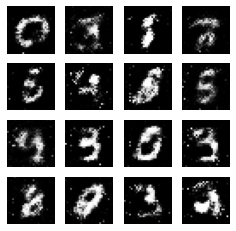

Epoch [28/50] batch [400/1875] lossD:  0.6861, lossG:  0.962505


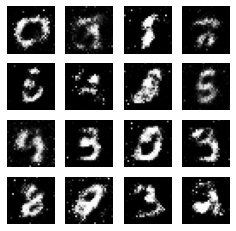

Epoch [28/50] batch [800/1875] lossD:  0.6156, lossG:  1.520670


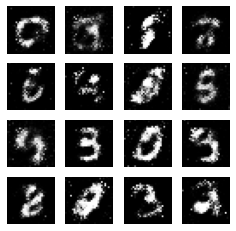

Epoch [28/50] batch [1200/1875] lossD:  0.6879, lossG:  1.377874


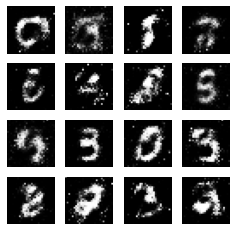

Epoch [28/50] batch [1600/1875] lossD:  0.6339, lossG:  1.253670


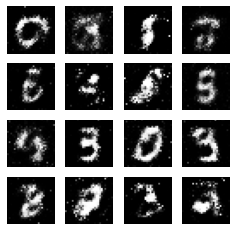

Epoch [29/50] batch [0/1875] lossD:  0.7533, lossG:  1.100990


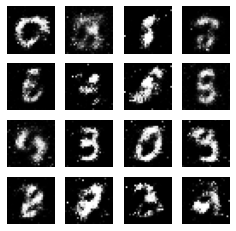

Epoch [29/50] batch [400/1875] lossD:  0.5528, lossG:  1.237869


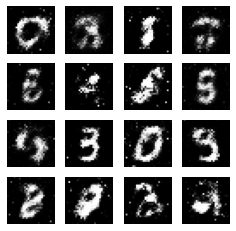

Epoch [29/50] batch [800/1875] lossD:  0.5689, lossG:  1.241386


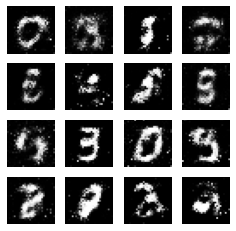

Epoch [29/50] batch [1200/1875] lossD:  0.5983, lossG:  1.288534


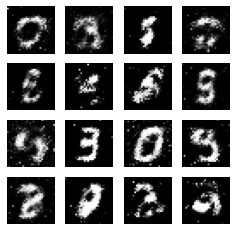

Epoch [29/50] batch [1600/1875] lossD:  0.6997, lossG:  0.915603


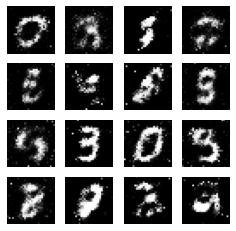

Epoch [30/50] batch [0/1875] lossD:  0.6474, lossG:  1.148969


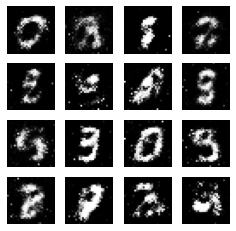

Epoch [30/50] batch [400/1875] lossD:  0.7833, lossG:  0.940609


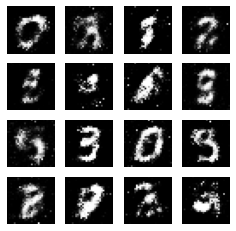

Epoch [30/50] batch [800/1875] lossD:  0.5761, lossG:  1.173149


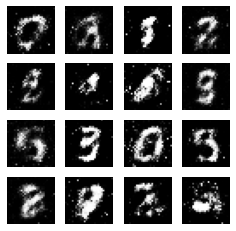

Epoch [30/50] batch [1200/1875] lossD:  0.6021, lossG:  1.190595


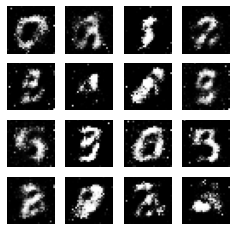

Epoch [30/50] batch [1600/1875] lossD:  0.6989, lossG:  1.303296


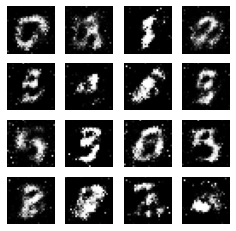

Epoch [31/50] batch [0/1875] lossD:  0.6498, lossG:  1.088321


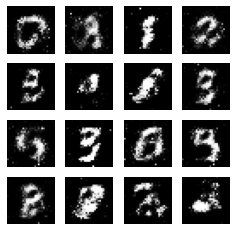

Epoch [31/50] batch [400/1875] lossD:  0.5578, lossG:  1.180216


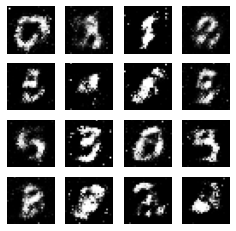

Epoch [31/50] batch [800/1875] lossD:  0.6034, lossG:  1.041130


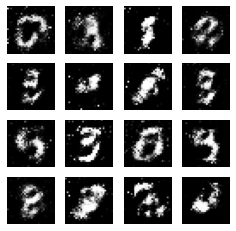

Epoch [31/50] batch [1200/1875] lossD:  0.7735, lossG:  1.004321


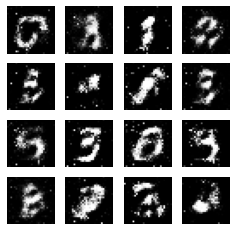

Epoch [31/50] batch [1600/1875] lossD:  0.7303, lossG:  0.973573


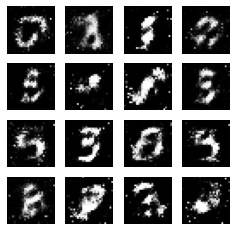

Epoch [32/50] batch [0/1875] lossD:  0.7005, lossG:  0.861882


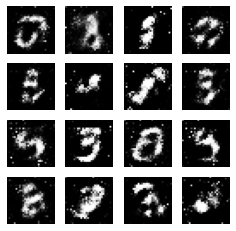

Epoch [32/50] batch [400/1875] lossD:  0.7219, lossG:  1.043689


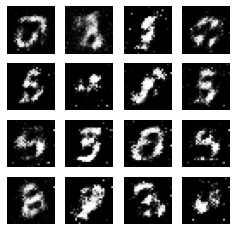

Epoch [32/50] batch [800/1875] lossD:  0.5756, lossG:  1.237154


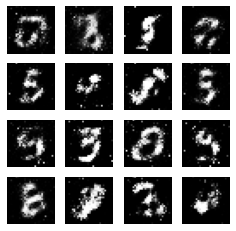

Epoch [32/50] batch [1200/1875] lossD:  0.5705, lossG:  0.950862


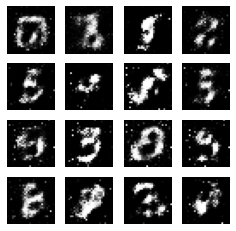

Epoch [32/50] batch [1600/1875] lossD:  0.5645, lossG:  1.072353


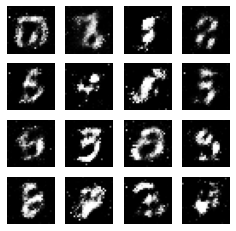

Epoch [33/50] batch [0/1875] lossD:  0.7257, lossG:  1.239625


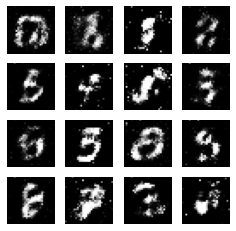

Epoch [33/50] batch [400/1875] lossD:  0.5397, lossG:  1.242605


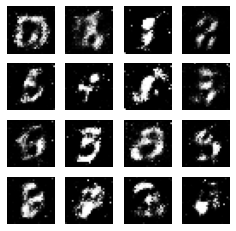

Epoch [33/50] batch [800/1875] lossD:  0.5738, lossG:  1.238230


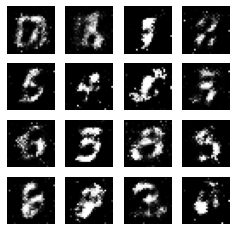

Epoch [33/50] batch [1200/1875] lossD:  0.5322, lossG:  1.205123


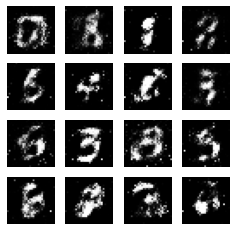

Epoch [33/50] batch [1600/1875] lossD:  0.6956, lossG:  1.046517


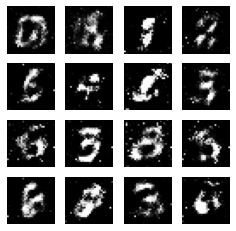

KeyboardInterrupt: ignored

In [14]:
for epoch in range(num_epochs):
  for batch_idx, (real, _) in enumerate(loader):
    real = real.view(-1, 784).to(device)
    batch_size = real.shape[0]

    noise = torch.randn(batch_size, z_dim).to(device)
    fake = gen(noise)
    disc_real = disc(real).view(-1)
    lossD_real = criterion(disc_real, torch.ones_like(disc_real))
    disc_fake = disc(fake).view(-1)
    lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
    lossD = (lossD_real+lossD_fake) / 2
    disc.zero_grad()
    lossD.backward(retain_graph = True)
    opt_disc.step()

    output = disc(fake).view(-1)
    lossG = criterion(output, torch.ones_like(output))
    gen.zero_grad()
    lossG.backward()
    opt_gen.step()
    if batch_idx % 400 == 0:
      print(f'Epoch [{epoch}/{num_epochs}] batch [{batch_idx}/{len(loader)}] lossD: {lossD: .4f}, lossG: {lossG: 4f}')
      with torch.no_grad():
        fake = gen(fixed_noise).view(-1,1,28,28)
        image_grid_fake = torchvision.utils.make_grid(fake, normalize=True)
        image_grid_real = torchvision.utils.make_grid(real, normalize = True)
        fake_16 = fake.view(-1, 28, 28)[:16]
        import matplotlib.pyplot as plt
        fig = plt.figure(figsize=(4,4))
        for i in range(16):
          plt.subplot(4,4,i+1)
          plt.imshow(fake_16[i].to('cpu'), cmap='gray')
          plt.axis('off')
        plt.show()
        writer_fake.add_image('mnist fake image', image_grid_fake, global_step=step)
        writer_real.add_image('mnist real image', image_grid_real, global_step = step)

        step+=1